<a href="https://colab.research.google.com/github/naelmostafa/computer-vision/blob/main/Assignment-4/object_detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Dependencies

## Download fiftyone

In [1]:
!pip install fiftyone

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 2.3 MB 14.7 MB/s 
     |████████████████████████████████| 192 kB 76.3 MB/s 
     |████████████████████████████████| 56 kB 5.1 MB/s 
     |████████████████████████████████| 133 kB 77.3 MB/s 
     |████████████████████████████████| 49 kB 7.0 MB/s 
     |████████████████████████████████| 226 kB 74.0 MB/s 
     |████████████████████████████████| 564 kB 75.3 MB/s 
     |████████████████████████████████| 108 kB 81.3 MB/s 
     |████████████████████████████████| 63 kB 2.8 MB/s 
     |████████████████████████████████| 79.9 MB 129 kB/s 
     |████████████████████████████████| 132 kB 56.9 MB/s 
     |████████████████████████████████| 57 kB 5.7 MB/s 
     |████████████████████████████████| 37.8 MB 126 kB/s 
     |████████████████████████████████| 80 kB 3.9 MB/s 
     |████████████████████████████████| 202 kB 65.9 MB/s 
     |████████████████████████████████| 5

## Imports

In [107]:
import torch
import torch.nn as nn
import torchvision
from PIL import Image
from torchvision.transforms import functional as func
from torch.utils.data import DataLoader
from torchvision import datasets
from torchvision.transforms import ToTensor
import plotly.graph_objects as go

import fiftyone as fo
import fiftyone.zoo as foz
from fiftyone import ViewField as F

In [111]:
from torchvision import models, transforms, utils
from torch.autograd import Variable
import numpy as np
import matplotlib.pyplot as plt
import scipy.misc
import json
%matplotlib inline

# Model intialization


*   Run on GPU if available
*   Load pre-trained Model
*   load model to GPU
*   Set to evalution mode

In [4]:
# Run on GPU
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu") 

## Faster R-CNN

In [5]:
# Load pre-trained model
model_rcnn = torchvision.models.detection.fasterrcnn_resnet50_fpn_v2(weights=torchvision.models.detection.FasterRCNN_ResNet50_FPN_V2_Weights.DEFAULT)
model_rcnn.to(device)
model_rcnn.eval()

print("Model Faster R-CNN")

Downloading: "https://download.pytorch.org/models/fasterrcnn_resnet50_fpn_v2_coco-dd69338a.pth" to /root/.cache/torch/hub/checkpoints/fasterrcnn_resnet50_fpn_v2_coco-dd69338a.pth


  0%|          | 0.00/167M [00:00<?, ?B/s]

Model Faster R-CNN


## FCOS: Fully Convolutional One-Stage Object Detection

In [6]:
# Load pre-trained model
model_fcos = torchvision.models.detection.fcos_resnet50_fpn(weights=torchvision.models.detection.FCOS_ResNet50_FPN_Weights.DEFAULT)
model_fcos.to(device)
model_fcos.eval()

print("Model FOCS")

Downloading: "https://download.pytorch.org/models/fcos_resnet50_fpn_coco-99b0c9b7.pth" to /root/.cache/torch/hub/checkpoints/fcos_resnet50_fpn_coco-99b0c9b7.pth


  0%|          | 0.00/124M [00:00<?, ?B/s]

Model FOCS


## SSD

In [7]:
model_ssd = torchvision.models.detection.ssd300_vgg16(weights=torchvision.models.detection.SSD300_VGG16_Weights.DEFAULT)
model_ssd.to(device)
model_ssd.eval()

print("Model SSD")

Downloading: "https://download.pytorch.org/models/ssd300_vgg16_coco-b556d3b4.pth" to /root/.cache/torch/hub/checkpoints/ssd300_vgg16_coco-b556d3b4.pth


  0%|          | 0.00/136M [00:00<?, ?B/s]

Model SSD


# Download COCO-2017 validation split and explore

## Download

In [8]:
# Download test split
dataset = foz.load_zoo_dataset(
    "coco-2017",
    split="validation",
)

dataset.persistent = True

INFO:fiftyone.zoo.datasets:Downloading split 'validation' to '/root/fiftyone/coco-2017/validation' if necessary


INFO:fiftyone.utils.coco:Downloading annotations to '/root/fiftyone/coco-2017/tmp-download/annotations_trainval2017.zip'


 100% |██████|    1.9Gb/1.9Gb [7.9s elapsed, 0s remaining, 253.3Mb/s]       


INFO:eta.core.utils: 100% |██████|    1.9Gb/1.9Gb [7.9s elapsed, 0s remaining, 253.3Mb/s]       


Extracting annotations to '/root/fiftyone/coco-2017/raw/instances_val2017.json'


INFO:fiftyone.utils.coco:Extracting annotations to '/root/fiftyone/coco-2017/raw/instances_val2017.json'


INFO:fiftyone.utils.coco:Downloading images to '/root/fiftyone/coco-2017/tmp-download/val2017.zip'


 100% |██████|    6.1Gb/6.1Gb [24.7s elapsed, 0s remaining, 277.1Mb/s]      


INFO:eta.core.utils: 100% |██████|    6.1Gb/6.1Gb [24.7s elapsed, 0s remaining, 277.1Mb/s]      


Extracting images to '/root/fiftyone/coco-2017/validation/data'


INFO:fiftyone.utils.coco:Extracting images to '/root/fiftyone/coco-2017/validation/data'


Writing annotations to '/root/fiftyone/coco-2017/validation/labels.json'


INFO:fiftyone.utils.coco:Writing annotations to '/root/fiftyone/coco-2017/validation/labels.json'


Dataset info written to '/root/fiftyone/coco-2017/info.json'


INFO:fiftyone.zoo.datasets:Dataset info written to '/root/fiftyone/coco-2017/info.json'


Loading 'coco-2017' split 'validation'


INFO:fiftyone.zoo.datasets:Loading 'coco-2017' split 'validation'


 100% |███████████████| 5000/5000 [29.0s elapsed, 0s remaining, 187.9 samples/s]      


INFO:eta.core.utils: 100% |███████████████| 5000/5000 [29.0s elapsed, 0s remaining, 187.9 samples/s]      


Dataset 'coco-2017-validation' created


INFO:fiftyone.zoo.datasets:Dataset 'coco-2017-validation' created


In [9]:
print(dataset)

Name:        coco-2017-validation
Media type:  image
Num samples: 5000
Persistent:  True
Tags:        []
Sample fields:
    id:           fiftyone.core.fields.ObjectIdField
    filepath:     fiftyone.core.fields.StringField
    tags:         fiftyone.core.fields.ListField(fiftyone.core.fields.StringField)
    metadata:     fiftyone.core.fields.EmbeddedDocumentField(fiftyone.core.metadata.ImageMetadata)
    ground_truth: fiftyone.core.fields.EmbeddedDocumentField(fiftyone.core.labels.Detections)


## Explore

In [104]:
print(dataset.first().ground_truth.detections[0])

<Detection: {
    'id': '63a59257783c46cf26a08575',
    'attributes': {},
    'tags': [],
    'label': 'potted plant',
    'bounding_box': [
        0.37028125,
        0.3345305164319249,
        0.038593749999999996,
        0.16314553990610328,
    ],
    'mask': None,
    'confidence': None,
    'index': None,
    'supercategory': 'furniture',
    'iscrowd': 0,
    'eval_f_rcnn': 'fn',
    'eval_f_rcnn_id': '',
    'eval_fcos': 'fn',
    'eval_fcos_id': '',
    'eval_ssd': 'fn',
    'eval_ssd_id': '',
}>


In [11]:
session = fo.launch_app(dataset)

# Run test and add predictions to dataset to visualize

In [12]:
# Classes
classes = dataset.default_classes
print(len(classes))

91


In [13]:
def prediction_inference(model, dataset, label_name:str):
  classes = dataset.default_classes
  # Add predictions to samples
  with fo.ProgressBar() as pb:
      for sample in pb(dataset):
          # Load image
          image = Image.open(sample.filepath)
          image = func.to_tensor(image).to(device)
          c, h, w = image.shape
          
          # Perform inference
          preds = model([image])[0]
          labels = preds["labels"].cpu().detach().numpy()
          scores = preds["scores"].cpu().detach().numpy()
          boxes = preds["boxes"].cpu().detach().numpy()
          
          # Convert detections to FiftyOne format
          detections = []
          for label, score, box in zip(labels, scores, boxes):
              # Convert to [top-left-x, top-left-y, width, height]
              # in relative coordinates in [0, 1] x [0, 1]
              x1, y1, x2, y2 = box
              rel_box = [x1 / w, y1 / h, (x2 - x1) / w, (y2 - y1) / h]

              detections.append(
                  fo.Detection(
                      label=classes[label],
                      bounding_box=rel_box,
                      confidence=score
                  )
              )
          
          # Save predictions to dataset
          sample[label_name] = fo.Detections(detections=detections)
          sample.save()

  print("Finished adding predictions")

In [14]:
prediction_inference(model_rcnn, dataset, "faster_rcnn")

 100% |███████████████| 5000/5000 [15.7m elapsed, 0s remaining, 5.6 samples/s]      


INFO:eta.core.utils: 100% |███████████████| 5000/5000 [15.7m elapsed, 0s remaining, 5.6 samples/s]      


Finished adding predictions


In [15]:
prediction_inference(model_fcos, dataset, "fcos")

 100% |███████████████| 5000/5000 [13.8m elapsed, 0s remaining, 6.6 samples/s]      


INFO:eta.core.utils: 100% |███████████████| 5000/5000 [13.8m elapsed, 0s remaining, 6.6 samples/s]      


Finished adding predictions


In [16]:
prediction_inference(model_ssd, dataset, "ssd")

 100% |███████████████| 5000/5000 [14.6m elapsed, 0s remaining, 5.9 samples/s]      


INFO:eta.core.utils: 100% |███████████████| 5000/5000 [14.6m elapsed, 0s remaining, 5.9 samples/s]      


Finished adding predictions


# Evaluate

In [17]:
# Only contains detections with confidence >= 0.75
high_conf_view = dataset.filter_labels("faster_rcnn", F("confidence") > 0.75, only_matches=False)
high_conf_view = high_conf_view.filter_labels("fcos", F("confidence") > 0.75, only_matches=False)
high_conf_view = high_conf_view.filter_labels("ssd", F("confidence") > 0.75, only_matches=False)

In [18]:
results_f_rcnn = high_conf_view.evaluate_detections(
    "faster_rcnn",
    gt_field="ground_truth",
    eval_key="eval_f_rcnn",
    compute_mAP=True,
    iou=0.5
)

results_fcos = high_conf_view.evaluate_detections(
    "fcos",
    gt_field="ground_truth",
    eval_key="eval_fcos",
    compute_mAP=True,
    iou=0.5
)

results_ssd = high_conf_view.evaluate_detections(
    "ssd",
    gt_field="ground_truth",
    eval_key="eval_ssd",
    compute_mAP=True,
    iou=0.5
)

Evaluating detections...


INFO:fiftyone.utils.eval.detection:Evaluating detections...


 100% |███████████████| 5000/5000 [3.0m elapsed, 0s remaining, 32.0 samples/s]      


INFO:eta.core.utils: 100% |███████████████| 5000/5000 [3.0m elapsed, 0s remaining, 32.0 samples/s]      


Performing IoU sweep...


INFO:fiftyone.utils.eval.coco:Performing IoU sweep...


 100% |███████████████| 5000/5000 [1.4m elapsed, 0s remaining, 75.6 samples/s]      


INFO:eta.core.utils: 100% |███████████████| 5000/5000 [1.4m elapsed, 0s remaining, 75.6 samples/s]      


Evaluating detections...


INFO:fiftyone.utils.eval.detection:Evaluating detections...


 100% |███████████████| 5000/5000 [1.6m elapsed, 0s remaining, 66.2 samples/s]      


INFO:eta.core.utils: 100% |███████████████| 5000/5000 [1.6m elapsed, 0s remaining, 66.2 samples/s]      


Performing IoU sweep...


INFO:fiftyone.utils.eval.coco:Performing IoU sweep...


 100% |███████████████| 5000/5000 [55.8s elapsed, 0s remaining, 94.0 samples/s]      


INFO:eta.core.utils: 100% |███████████████| 5000/5000 [55.8s elapsed, 0s remaining, 94.0 samples/s]      


Evaluating detections...


INFO:fiftyone.utils.eval.detection:Evaluating detections...


 100% |███████████████| 5000/5000 [1.7m elapsed, 0s remaining, 58.6 samples/s]      


INFO:eta.core.utils: 100% |███████████████| 5000/5000 [1.7m elapsed, 0s remaining, 58.6 samples/s]      


Performing IoU sweep...


INFO:fiftyone.utils.eval.coco:Performing IoU sweep...


 100% |███████████████| 5000/5000 [1.0m elapsed, 0s remaining, 91.2 samples/s]       


INFO:eta.core.utils: 100% |███████████████| 5000/5000 [1.0m elapsed, 0s remaining, 91.2 samples/s]       


# Faster RCNN results

*   Precision Recall f1-score support
*   mAP
*   pr curve

In [19]:
print(f'mAP: {results_f_rcnn.mAP()}')
results_f_rcnn.print_report()

mAP: 0.4137271949931054
                precision    recall  f1-score   support

      airplane       0.78      0.87      0.83       143
         apple       0.53      0.33      0.40       242
      backpack       0.59      0.31      0.41       371
        banana       0.68      0.42      0.52       404
  baseball bat       0.78      0.60      0.68       146
baseball glove       0.82      0.64      0.72       148
          bear       0.89      0.79      0.84        71
           bed       0.68      0.60      0.64       163
         bench       0.63      0.42      0.50       413
       bicycle       0.76      0.59      0.66       316
          bird       0.85      0.59      0.69       501
          boat       0.65      0.60      0.62       439
          book       0.65      0.35      0.46      1276
        bottle       0.70      0.62      0.66      1085
          bowl       0.66      0.59      0.63       633
      broccoli       0.58      0.46      0.51       323
           bus       0.

In [20]:
plot = results_f_rcnn.plot_pr_curves()
plot.show()

# FCOS results

*   Precision Recall f1-score support
*   mAP
*   pr curve



In [22]:
print(f'mAP: {results_fcos.mAP()}')
results_fcos.print_report()

mAP: 0.15120693026011073
                precision    recall  f1-score   support

      airplane       0.99      0.52      0.68       143
         apple       0.67      0.01      0.02       239
      backpack       0.80      0.01      0.02       371
        banana       0.93      0.04      0.07       379
  baseball bat       0.90      0.06      0.12       146
baseball glove       0.97      0.26      0.41       148
          bear       1.00      0.52      0.69        71
           bed       0.90      0.12      0.21       163
         bench       0.97      0.08      0.16       413
       bicycle       0.91      0.07      0.12       316
          bird       0.99      0.18      0.31       440
          boat       0.89      0.04      0.07       430
          book       1.00      0.00      0.01      1161
        bottle       0.94      0.07      0.12      1025
          bowl       0.88      0.04      0.09       626
      broccoli       1.00      0.02      0.04       316
           bus       0

In [23]:
plot = results_fcos.plot_pr_curves()
plot.show()

# SSD results

*   Precision Recall f1-score support
*   mAP
*   pr curve

In [24]:
print(f'mAP: {results_ssd.mAP()}')
results_ssd.print_report()

mAP: 0.14422599907152245
                precision    recall  f1-score   support

      airplane       0.93      0.49      0.64       143
         apple       0.67      0.03      0.05       239
      backpack       0.80      0.01      0.02       371
        banana       0.93      0.07      0.12       379
  baseball bat       0.80      0.08      0.15       146
baseball glove       0.88      0.05      0.09       148
          bear       0.98      0.61      0.75        71
           bed       0.94      0.37      0.54       163
         bench       0.89      0.11      0.20       413
       bicycle       0.92      0.14      0.24       316
          bird       0.98      0.14      0.25       440
          boat       0.91      0.07      0.14       430
          book       1.00      0.00      0.01      1161
        bottle       0.85      0.03      0.05      1025
          bowl       0.86      0.15      0.26       626
      broccoli       0.66      0.06      0.11       316
           bus       1

In [25]:
plot = results_ssd.plot_pr_curves()
plot.show()

# Plotting IOU Distribution

In [105]:
def iou_dist(data):
  iou_f_rcnn = []
  iou_fcos = []
  iou_ssd = []

  with fo.ProgressBar() as pb:
      for sample in pb(data):
        for detection in sample.faster_rcnn.detections:
          if detection.eval_f_rcnn == 'tp':
            iou_f_rcnn.append(detection.eval_f_rcnn_iou)
        for detection in sample.fcos.detections:
          if detection.eval_fcos == 'tp':
            iou_fcos.append(detection.eval_fcos_iou)
        for detection in sample.ssd.detections:
          if detection.eval_ssd == 'tp':
            iou_ssd.append(detection.eval_ssd_iou)

  return iou_f_rcnn, iou_fcos, iou_ssd


In [132]:
iou_f_rcnn, iou_fcos, iou_ssd = iou_dist(high_conf_view)
print('Average IOU')
print('Faster R-CNN: ', np.average(iou_f_rcnn))
print('FCOS: ', np.average(iou_fcos))
print('SSD: ', np.average(iou_ssd))

 100% |███████████████| 5000/5000 [40.9s elapsed, 0s remaining, 137.8 samples/s]      


INFO:eta.core.utils: 100% |███████████████| 5000/5000 [40.9s elapsed, 0s remaining, 137.8 samples/s]      


Average IOU
Faster R-CNN:  0.8607290494493618
FCOS:  0.8972196556947734
SSD:  0.8504480012732636


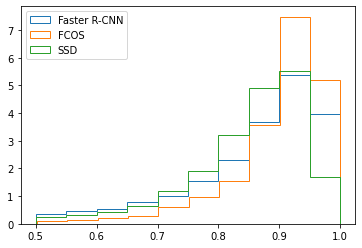

In [133]:
fig,ax = plt.subplots()
ax.hist(iou_f_rcnn, label="Faster R-CNN", histtype="step", density=True)
ax.hist(iou_fcos, label="FCOS", histtype="step", density=True)
ax.hist(iou_ssd, label="SSD", histtype="step", density=True)
plt.legend(loc='upper left')
plt.show()

## Faster R-CNN

In [ ]:
fig = go.Figure()
fig = results_f_rcnn.plot_confusion_matrix(classes=classes)
fig.update_layout(
    autosize=False,
    width=1000,
    height=1000,
    margin=dict(
        l=50,
        r=50,
        b=100,
        t=100,
        pad=4
    ),)
fig.show()

# Plotting Confusion Matrices

## Faster R-CNN

In [167]:
fig = go.Figure()
fig = results_f_rcnn.plot_confusion_matrix(classes=classes)
fig.update_layout(autosize=False, width=1050, height=1050)
fig.show()

## FCOS

In [168]:
fig = go.Figure()
fig = results_fcos.plot_confusion_matrix(classes=classes)
fig.update_layout(autosize=False, width=1050, height=1050)
fig.show()

/usr/local/lib/python3.8/dist-packages/fiftyone/core/plots/plotly.py:1782: UserWarning:

Interactive plots are currently only supported in Jupyter notebooks. Support outside of notebooks and in Google Colab will be included in an upcoming release. In the meantime, you can still use this plot, but note that (i) selecting data will not trigger callbacks, and (ii) you must manually call `plot.show()` to launch a new plot that reflects the current state of an attached session.

See https://voxel51.com/docs/fiftyone/user_guide/plots.html#working-in-notebooks for more information.



## SSD

In [169]:
fig = go.Figure()
fig = results_ssd.plot_confusion_matrix(classes=classes)
fig.update_layout(autosize=False, width=1050, height=1050)
fig.show()

# Explore high Confidence view

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


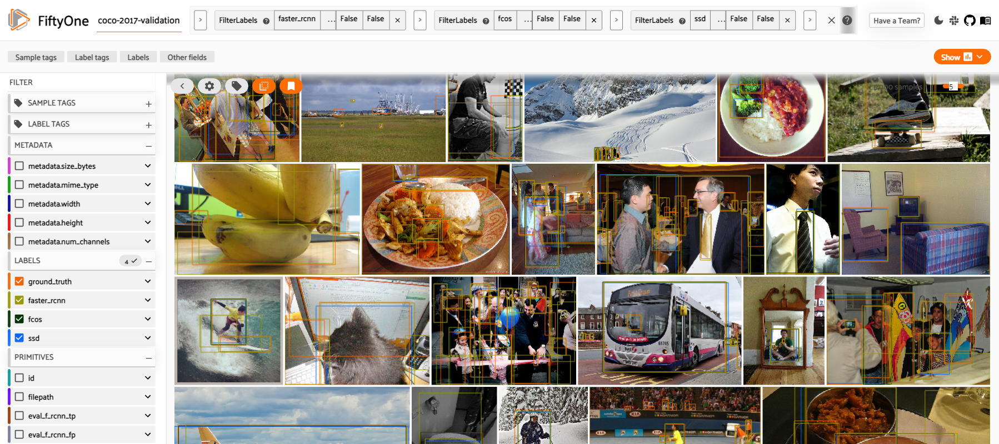

<IPython.core.display.Javascript object>

In [146]:
session0 = fo.launch_app(high_conf_view)

## Faster RCNN

In [173]:
# Show samples with most true positives
session1 = fo.launch_app(high_conf_view.sort_by("eval_f_rcnn_tp", reverse=True))

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


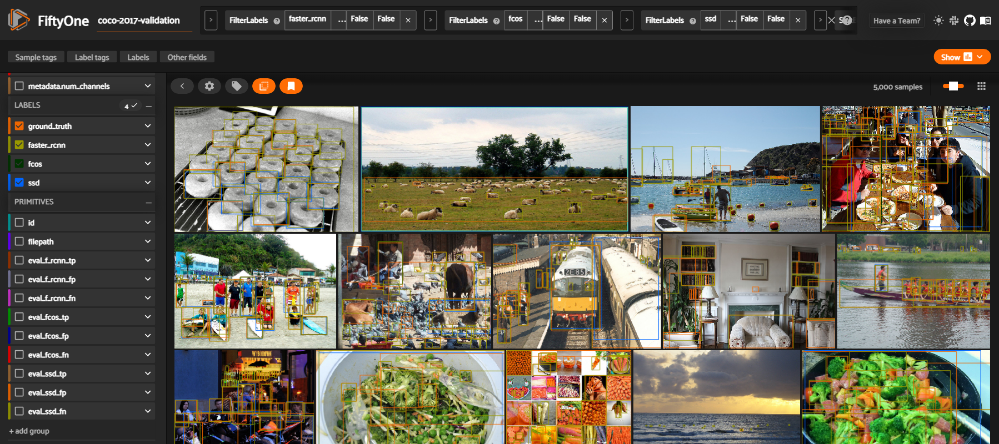

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


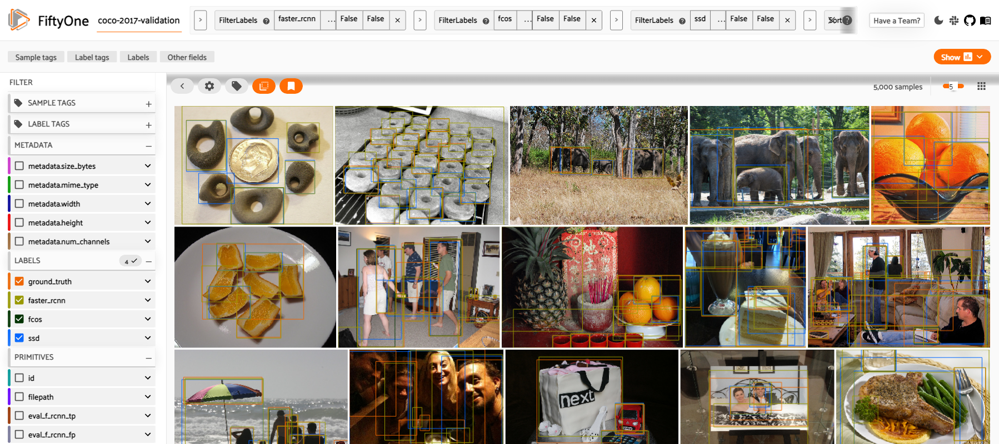

<IPython.core.display.Javascript object>

In [143]:
# Show samples with most true positives
session2 = fo.launch_app(high_conf_view.sort_by("eval_f_rcnn_fp", reverse=True))

## FCOS

In [170]:
# Show samples with most true positives
session3 = fo.launch_app(high_conf_view.sort_by("eval_fcos_tp", reverse=True))

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


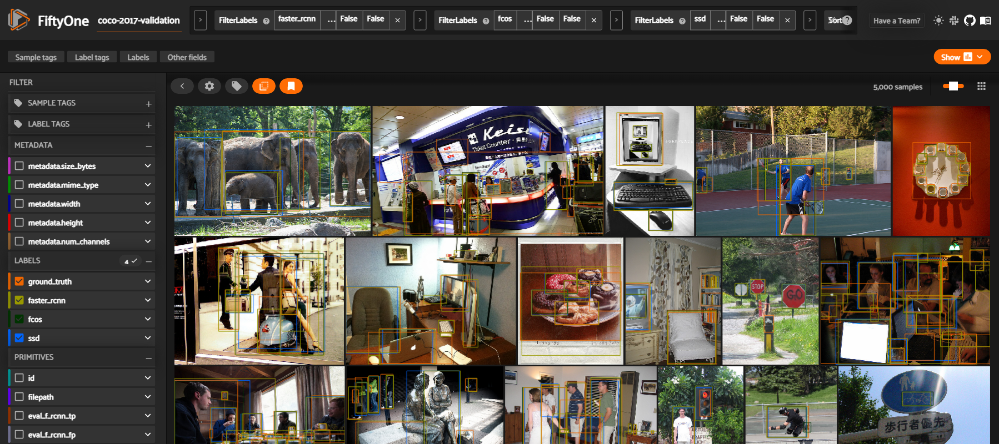

<IPython.core.display.Javascript object>

In [138]:
# Show samples with most true positives
session4 = fo.launch_app(high_conf_view.sort_by("eval_fcos_fp", reverse=True))

## SSD

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


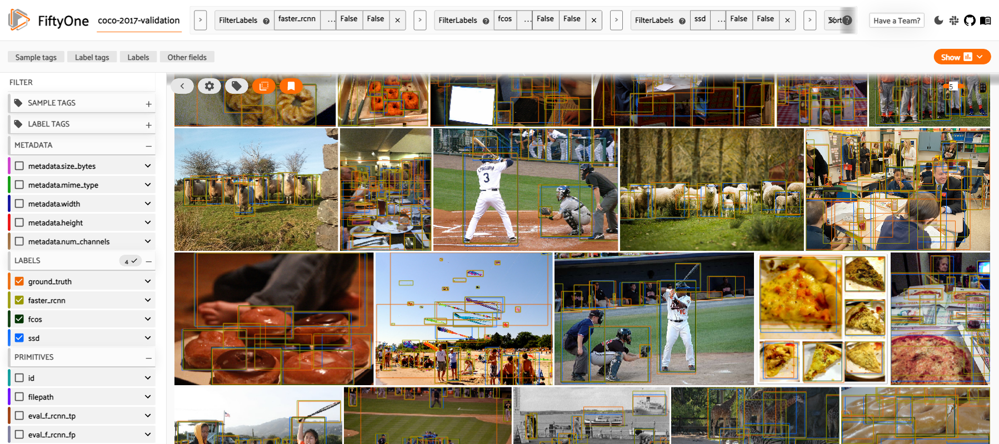

<IPython.core.display.Javascript object>

In [147]:
# Show samples with most true positives
session5 = fo.launch_app(high_conf_view.sort_by("eval_ssd_tp", reverse=True))

In [172]:
# Show samples with most false positives
session6 = fo.launch_app(high_conf_view.sort_by("eval_ssd_fp", reverse=True))

# Visualizing Feature Maps of Faster-RCNN Model

## Exploring Layers in Model

In [31]:
print(model_rcnn)

FasterRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
       

In [32]:
for name0, child0 in model_rcnn.named_children():
  for name1, child1 in child0.named_children():
    for name2, child2 in child1.named_children():
      if type(child2) == nn.Sequential:
        for j in range(len(child2)):
          for child in child2[j].children():
            # if type(child) == nn.Conv2d:
              print(name0, name1, type(child2), type(child))
      else:
        print(name0, name1, type(child2))

backbone body <class 'torch.nn.modules.conv.Conv2d'>
backbone body <class 'torch.nn.modules.batchnorm.BatchNorm2d'>
backbone body <class 'torch.nn.modules.activation.ReLU'>
backbone body <class 'torch.nn.modules.pooling.MaxPool2d'>
backbone body <class 'torch.nn.modules.container.Sequential'> <class 'torch.nn.modules.conv.Conv2d'>
backbone body <class 'torch.nn.modules.container.Sequential'> <class 'torch.nn.modules.batchnorm.BatchNorm2d'>
backbone body <class 'torch.nn.modules.container.Sequential'> <class 'torch.nn.modules.conv.Conv2d'>
backbone body <class 'torch.nn.modules.container.Sequential'> <class 'torch.nn.modules.batchnorm.BatchNorm2d'>
backbone body <class 'torch.nn.modules.container.Sequential'> <class 'torch.nn.modules.conv.Conv2d'>
backbone body <class 'torch.nn.modules.container.Sequential'> <class 'torch.nn.modules.batchnorm.BatchNorm2d'>
backbone body <class 'torch.nn.modules.container.Sequential'> <class 'torch.nn.modules.activation.ReLU'>
backbone body <class 'torch

## Extracting Convolution Layers from Model

In [33]:
# we will save the conv layer weights in this list
model_weights =[]
#we will save the 49 conv layers in this list
conv_layers = []
# get all the model children as list
model_children = list(model_rcnn.children())
#counter to keep count of the conv layers
counter = 0
#append all the conv layers and their respective wights to the list
for name0, child0 in model_rcnn.named_children():
  for name1, child1 in child0.named_children():
    for name2, child2 in child1.named_children():

      if type(child2) == nn.Conv2d:
          counter+=1
          model_weights.append(child2.weight)
          conv_layers.append(child2)
      elif type(child2) == nn.Sequential:
          for j in range(len(child2)):
              for child in child2[j].children():
                  if type(child) == nn.Conv2d:
                      counter+=1
                      model_weights.append(child.weight)
                      conv_layers.append(child)
print(f"Total convolution layers: {counter}")
print("Convolution Layers:")
for conv_layer in conv_layers:
  print(conv_layer)

Total convolution layers: 53
Convolution Layers:
Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
Conv2d(256, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
Conv2d(256, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
Conv2d(256, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
Conv2d(128, 128, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
Conv2d(128, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
Conv2d(512, 128, kernel_size=(1, 1), stride=(1, 1), bia

## Running on Sample Image

In [34]:
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=0., std=1.)
])

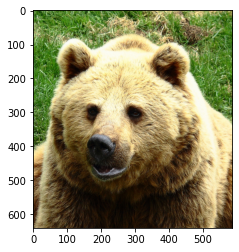

In [52]:
# sample = dataset.first()
sample = dataset['63a59257783c46cf26a0859d']
image = Image.open(sample.filepath)
plt.imshow(image)

In [53]:
image = transform(image)
print(f"Image shape before: {image.shape}")
image = image.unsqueeze(0)
print(f"Image shape after: {image.shape}")
image = image.to(device)

Image shape before: torch.Size([3, 224, 224])
Image shape after: torch.Size([1, 3, 224, 224])


In [54]:
outputs = []
names = []

for layer in conv_layers[0:]:
    try:
      # print(layer)
      image = layer(image)
      outputs.append(image)
      names.append(str(layer))
    except:
      pass 


print(len(outputs))
#print feature_maps
for feature_map in outputs:
    print(feature_map.shape)

49
torch.Size([1, 64, 112, 112])
torch.Size([1, 64, 112, 112])
torch.Size([1, 64, 112, 112])
torch.Size([1, 256, 112, 112])
torch.Size([1, 64, 112, 112])
torch.Size([1, 64, 112, 112])
torch.Size([1, 256, 112, 112])
torch.Size([1, 64, 112, 112])
torch.Size([1, 64, 112, 112])
torch.Size([1, 256, 112, 112])
torch.Size([1, 128, 112, 112])
torch.Size([1, 128, 56, 56])
torch.Size([1, 512, 56, 56])
torch.Size([1, 128, 56, 56])
torch.Size([1, 128, 56, 56])
torch.Size([1, 512, 56, 56])
torch.Size([1, 128, 56, 56])
torch.Size([1, 128, 56, 56])
torch.Size([1, 512, 56, 56])
torch.Size([1, 128, 56, 56])
torch.Size([1, 128, 56, 56])
torch.Size([1, 512, 56, 56])
torch.Size([1, 256, 56, 56])
torch.Size([1, 256, 28, 28])
torch.Size([1, 1024, 28, 28])
torch.Size([1, 256, 28, 28])
torch.Size([1, 256, 28, 28])
torch.Size([1, 1024, 28, 28])
torch.Size([1, 256, 28, 28])
torch.Size([1, 256, 28, 28])
torch.Size([1, 1024, 28, 28])
torch.Size([1, 256, 28, 28])
torch.Size([1, 256, 28, 28])
torch.Size([1, 1024, 2

In [55]:
processed = []
for feature_map in outputs:
    feature_map = feature_map.squeeze(0)
    gray_scale = torch.sum(feature_map,0)
    gray_scale = gray_scale / feature_map.shape[0]
    processed.append(gray_scale.data.cpu().numpy())
for fm in processed:
    print(fm.shape)

(112, 112)
(112, 112)
(112, 112)
(112, 112)
(112, 112)
(112, 112)
(112, 112)
(112, 112)
(112, 112)
(112, 112)
(112, 112)
(56, 56)
(56, 56)
(56, 56)
(56, 56)
(56, 56)
(56, 56)
(56, 56)
(56, 56)
(56, 56)
(56, 56)
(56, 56)
(56, 56)
(28, 28)
(28, 28)
(28, 28)
(28, 28)
(28, 28)
(28, 28)
(28, 28)
(28, 28)
(28, 28)
(28, 28)
(28, 28)
(28, 28)
(28, 28)
(28, 28)
(28, 28)
(28, 28)
(28, 28)
(28, 28)
(14, 14)
(14, 14)
(14, 14)
(14, 14)
(14, 14)
(14, 14)
(14, 14)
(14, 14)


## Results

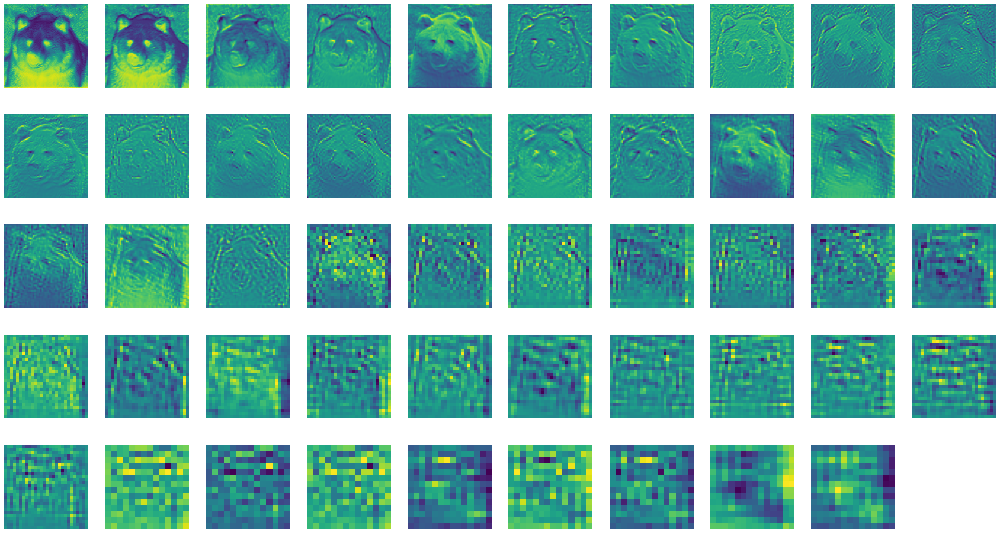

In [56]:
fig = plt.figure(figsize=(30, 20))
for i in range(len(processed)):
    a = fig.add_subplot(6, 10, i+1)
    imgplot = plt.imshow(processed[i])
    a.axis("off")
plt.savefig(str('feature_maps.jpg'), bbox_inches='tight')